In [1]:
import os, platform, pprint, sys
import fastai
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn
import yellowbrick as yb

from fastai.tabular.data import TabularDataLoaders, TabularPandas
from fastai.tabular.all import FillMissing, Categorify, Normalize, tabular_learner, accuracy, ClassificationInterpretation, ShowGraphCallback, RandomSplitter, range_of

from sklearn.base import BaseEstimator
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit, cross_val_score
from sklearn.neighbors import KNeighborsClassifier

from yellowbrick.model_selection import CVScores, LearningCurve, ValidationCurve



seed: int = 14


# set up pretty printer for easier data evaluation
pretty = pprint.PrettyPrinter(indent=4, width=30).pprint


# declare file paths for the data we will be working on
data_path_1: str = '../data/downsampled/baseline/'
data_path_2: str = '../data/downsampled/timebased/'
modelPath  : str = './models'


# list the names of the datasets we will be using
attacks : list = [ 'DNS', 'LDAP', 'MSSQL', 'NetBIOS', 'NTP', 'Portmap', 'SNMP', 'SSDP', 'Syn', 'TFTP', 'UDP', 'UDPLag' ]
datasets: list = [
    "DNS_vs_all_200000.csv" , "LDAP_vs_all_200000.csv"    , "MSSQL_vs_all_200000.csv" , "NetBIOS_vs_all_200000.csv" ,
    "NTP_vs_all_200000.csv" , "Portmap_vs_all_200000.csv" , "SNMP_vs_all_200000.csv"  , "SSDP_vs_all_200000.csv"    ,
    "Syn_vs_all_200000.csv" , "TFTP_vs_all_200000.csv"    , "UDP_vs_all_200000.csv"   , "UDPLag_vs_all_200000.csv"  ,
]


# set up enumeration of experiment types
Baseline : int = 0
Timebased: int = 1


# print library and python versions for reproducibility
print(
    f'''
    python:\t{platform.python_version()}

    \tfastai:\t\t{fastai.__version__}
    \tmatplotlib:\t{mpl.__version__}
    \tnumpy:\t\t{np.__version__}
    \tpandas:\t\t{pd.__version__}
    \tsklearn:\t{sklearn.__version__}
    \tyellowbrick:\t{yb.__version__}
    '''
)


    python:	3.7.10

    	fastai:		2.4.1
    	matplotlib:	3.3.4
    	numpy:		1.20.3
    	pandas:		1.2.5
    	sklearn:	0.24.2
    	yellowbrick:	1.3.post1
    


In [2]:
def get_file_path(directory: str):
    '''
        Closure that will return a function that returns the filepath to the directory given to the closure
    '''

    def func(file: str) -> str:
        return os.path.join(directory, file)

    return func


# use the get_file_path closure to create a function that will return the path to a file
baseline_path  = get_file_path(data_path_1)
timebased_path = get_file_path(data_path_2)


# create a list of the paths to all of the dataset files
baseline_files : list = list(map(baseline_path , datasets))
timebased_files: list = list(map(timebased_path, datasets))

In [3]:
def load_data(filePath: str) -> pd.DataFrame:
    '''
        Loads the Dataset from the given filepath and caches it for quick access in the future
        Function will only work when filepath is a .csv file
    '''

    # slice off the ./CSV/ from the filePath
    if filePath[0] == '.' and filePath[1] == '.':
        filePathClean: str = filePath[20::]
        pickleDump: str = f'../data/cache/{filePathClean}.pickle'
    else:
        pickleDump: str = f'../data/cache/{filePath}.pickle'
    
    print(f'Loading Dataset: {filePath}')
    print(f'\tTo Dataset Cache: {pickleDump}\n')
    
    # check if data already exists within cache
    if os.path.exists(pickleDump):
        df = pd.read_pickle(pickleDump)
        
    # if not, load data and cache it
    else:
        df = pd.read_csv(filePath, low_memory=True)
        df.to_pickle(pickleDump)

    
    return df


def run_experiment(df, name) -> tuple:
    '''
        Run binary classification using K-Nearest Neighbors 
        where the number of neighbors is determined by a grid search
        performed on a down-sampled version of the data

        returns the 7-tuple with the following indicies:
        results: tuple = (name, model, classes, X_train, y_train, X_test, y_test)
    '''

    print(f'{name}: {df.shape}')


    # down sample the data to speed up the grid search
    samples          : int = df.shape[0]
    grid_search_size : int = 50000

    grid_df = df.sample(n=grid_search_size , random_state=seed)


    # we split the features into the dependent variable and 
    # continous and categorical features
    dep_var: str = 'Label'
    if 'Protocol' in df.columns:
        categorical_features: list = ['Protocol']
    else:
        categorical_features: list = []
    continuous_features = list(set(df) - set(categorical_features) - set([dep_var]))


    # Next, we set up the feature engineering pipeline, namely filling missing values
    # encoding categorical features, and normalizing the continuous features
    # all within a pipeline to prevent the normalization from leaking details
    # about the test sets through the normalized mapping of the training sets
    procs       = [FillMissing, Categorify, Normalize]
    splits      = RandomSplitter(valid_pct=0.2, seed=seed)(range_of( df      ))
    grid_splits = RandomSplitter(valid_pct=0  , seed=seed)(range_of( grid_df ))
    
    
    # The dataframe is loaded into a fastai datastructure now that 
    # the feature engineering pipeline has been set up
    to_grid = TabularPandas(
        grid_df            , y_names=dep_var                , 
        splits=grid_splits , cat_names=categorical_features ,
        procs=procs        , cont_names=continuous_features , 
    )

    to = TabularPandas(
        df            , y_names=dep_var                , 
        splits=splits , cat_names=categorical_features ,
        procs=procs   , cont_names=continuous_features , 
    )


    # We use fastai to quickly extract the names of the classes as they are mapped to the encodings
    dls = to.dataloaders(bs=64)
    mds = tabular_learner(dls)
    classes : list = list(mds.dls.vocab)


    # We extract the training and test datasets from the dataframe
    X_train = to.train.xs.reset_index(drop=True)
    X_test = to.valid.xs.reset_index(drop=True)
    y_train = to.train.ys.values.ravel()
    y_test = to.valid.ys.values.ravel()

    X_train_grid = to_grid.train.xs.reset_index(drop=True)
    y_train_grid = to_grid.train.ys.values.ravel()


    # Now that we have the train and test datasets, we set up a gridsearch of the K-NN classifier
    # using SciKitLearn and print the results 
    
    print(f'Running gridsearch on {grid_search_size} out of {samples} samples')
    params = {
        "n_neighbors": list(map(lambda x: 2*x + 1, range(1, 24))), 
        "weights"    : ["uniform", "distance"]                   , 
        'p'          : [1, 2] 
    }
    gridsearch = GridSearchCV(KNeighborsClassifier(), params, verbose=1)
    gridsearch.fit(X_train_grid, y_train_grid)
    print(f"\tBest Parameters found by gridsearch: {gridsearch.best_params_}\n")


    # We set up the model using the best parameters found by the gridsearch
    print(f'Running K-Nearest Neighbors on {samples} samples')
    model = KNeighborsClassifier(
        n_neighbors = gridsearch.best_params_['n_neighbors'] , 
        weights     = gridsearch.best_params_['weights']     , 
        p           = gridsearch.best_params_['p']
    )
    model.fit(X_train, y_train)
    prediction = model.predict(X_test)
    print(f'\tAccuracy: {accuracy_score(y_test, prediction)}\n')
    report = classification_report(y_test, prediction)
    print(report)

    # # we cross-validate the model using 3-folds
    # print('\n3-Fold Cross-Validation Scores\n')
    # result = cross_val_score(model, X_train, y_train, cv=StratifiedShuffleSplit(n_splits=3, test_size=0.2, random_state=seed))
    # print(f"\tAccuracy: {results.mean()*100}%")


    # we add a target_type_ attribute to our model so yellowbrick knows how to make the visualizations
    if len(classes) == 2:
        model.target_type_ = 'binary'
    elif len(classes) > 2:  
        model.target_type_ = 'multiclass'
    else:
        print('Must be more than one class to perform classification')
        raise ValueError('Wrong number of classes')

    # we create a confusion matrix to visualize the results
    visualizer = yb.classifier.ConfusionMatrix(model, classes=classes, title=f'{name} Confusion Matrix')
    visualizer.score(X_test, y_test)
    visualizer.show()


    # Now that the classifier has been created and trained, we pass out our training values
    # so that yellowbrick can use them to create other visualizations
    return (name, model, classes, X_train, y_train, X_test, y_test)


def visualize_learning_curve_train(results: tuple) -> None:
    '''
        Takes a 7-tuple from the run_experiments function and creates a learning curve

        results: tuple = (name, model, classes, X_train, y_train, X_test, y_test)
    '''

    # Track the learning curve of the classifier, here we want the 
    # training and validation scores to approach 1
    visualizer = LearningCurve(results[1], scoring='f1_weighted')
    visualizer.fit(results[3], results[4])
    visualizer.show()


def visualize_learning_curve_test(results: tuple) -> None:
    '''
        Takes a 7-tuple from the run_experiments function and creates a learning curve

        results: tuple = (name, model, classes, X_train, y_train, X_test, y_test)
    '''

    # Track the learning curve of the classifier, here we want the 
    # training and validation scores to approach 1
    visualizer = LearningCurve(results[1], scoring='f1_weighted')
    visualizer.fit(results[5], results[6])
    visualizer.show()


def visualize_roc(results: tuple) -> None:
    '''
        Takes a 7-tuple from the run_experiments function and creates a 
        Receiver Operating Characteristic (ROC) Curve

        results: tuple = (name, model, classes, X_train, y_train, X_test, y_test)
    '''

    visualizer = yb.classifier.ROCAUC(results[1], classes=results[2], title=results[0])
    visualizer.score(results[5], results[6])
    visualizer.poof()


def visualize_pr_curve(results: tuple) -> None:
    '''
        Takes a 7-tuple from the run_experiments function and creates a 
        Precision-Recall Curve

        results: tuple = (name, model, classes, X_train, y_train, X_test, y_test)
    '''

    visualizer = yb.classifier.PrecisionRecallCurve(results[1], title=results[0])
    visualizer.score(results[5], results[6])
    visualizer.poof()


def visualize_report(results: tuple) -> None:
    '''
        Takes a 7-tuple from the run_experiments function and creates a report
        detailing the Precision, Recall, f1, and Support scores for all 
        classification outcomes

        results: tuple = (name, model, classes, X_train, y_train, X_test, y_test)
    '''

    visualizer = yb.classifier.ClassificationReport(results[1], classes=results[2], title=results[0], support=True)
    visualizer.score(results[5], results[6])
    visualizer.poof()


def visualize_class_balance(results: tuple) -> None:
    '''
        Takes a 7-tuple from the run_experiments function and creates a histogram
        detailing the balance between classification outcomes

        results: tuple = (name, model, classes, X_train, y_train, X_test, y_test)
    '''

    visualizer = yb.target.ClassBalance(labels=results[0])
    visualizer.fit(results[4], results[6])
    visualizer.show()

In [4]:
def do_experiment(num: int) -> tuple:
    '''
        A function that runs the specific experiment specified
    '''
    index = num - 1
    baseline = load_data(baseline_files[index])
    timebased = load_data(timebased_files[index])
    info = attacks[index]

    print(f'Running experiment #{num}:\t{info}')

    print('\nBaseline results\n')
    baseline_results = run_experiment(baseline, f'{info}_vs_all_baseline')
    
    print('\nTime-based results\n')
    timebased_results = run_experiment(timebased, f'{info}_vs_all_timebased')

    return (baseline_results, timebased_results, info, num)

## Experiment #1: DNS vs All

Loading Dataset: ../data/downsampled/baseline/DNS_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/DNS_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/DNS_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/DNS_vs_all_200000.csv.pickle

Running experiment #1:	DNS

Baseline results

DNS_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 11, 'p': 1, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9113977849446236

              precision    recall  f1-score   support

           0       0.90      0.93      0.91     20081
           1       0.93      0.89      0.91     19918

    accuracy                           0.91     39999
   macro avg       0.91      0.91      0.91     39999
weighted avg       0.91      0.91      0.91     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


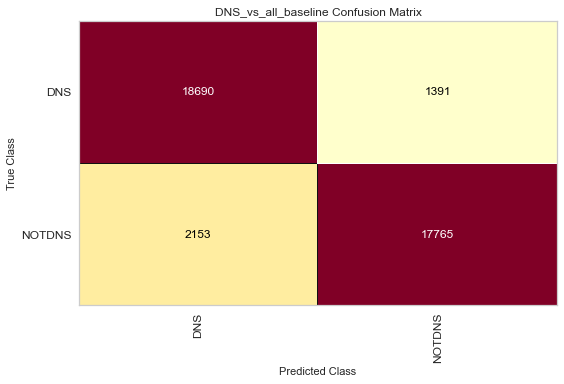


Time-based results

DNS_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 27, 'p': 2, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9128728218205455

              precision    recall  f1-score   support

           0       0.87      0.98      0.92     20081
           1       0.97      0.85      0.91     19918

    accuracy                           0.91     39999
   macro avg       0.92      0.91      0.91     39999
weighted avg       0.92      0.91      0.91     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


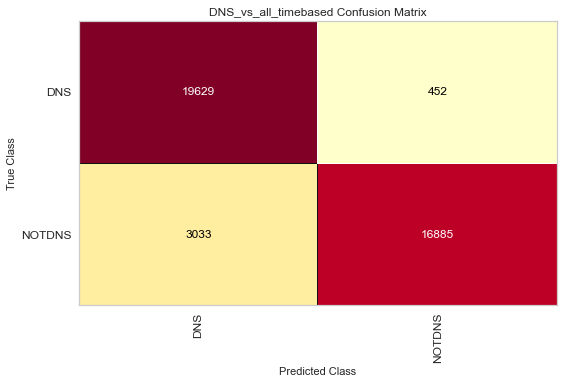

In [5]:
results = do_experiment(1)

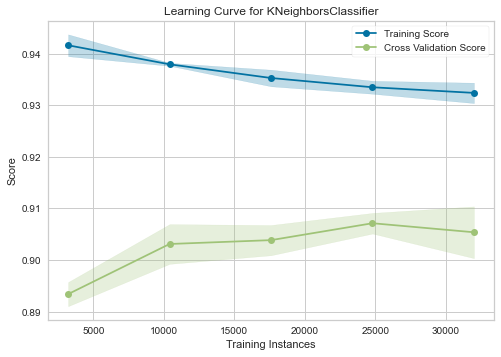

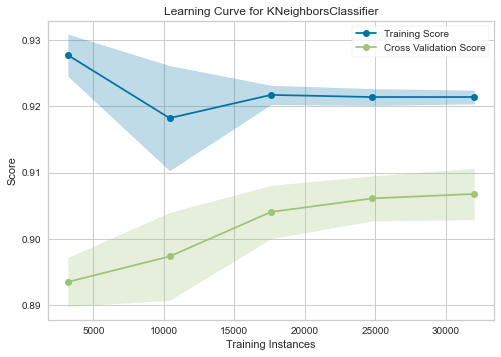

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


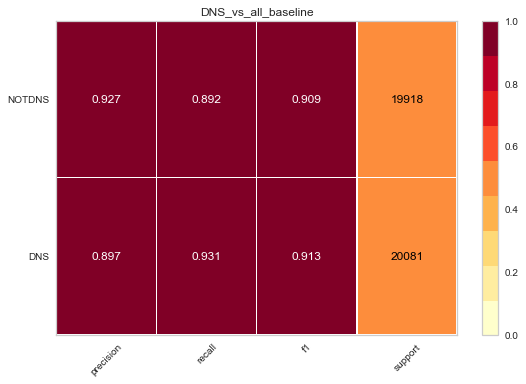

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


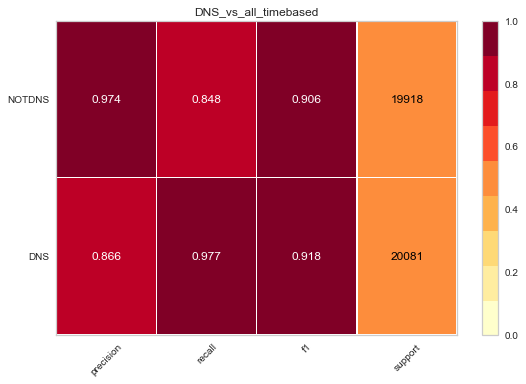

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


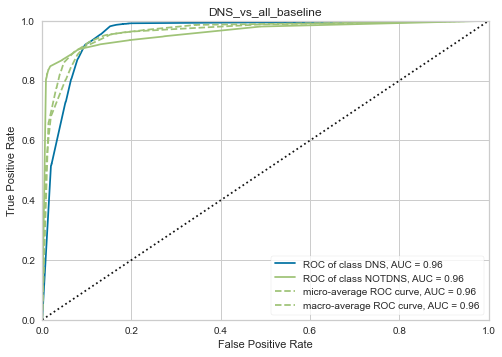

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


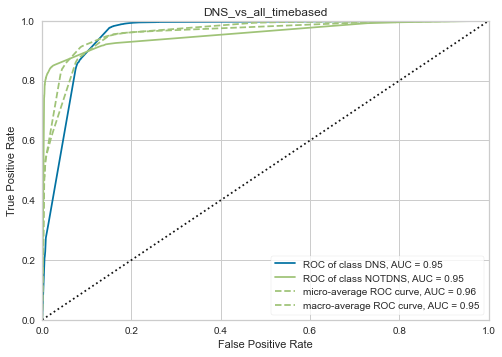

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


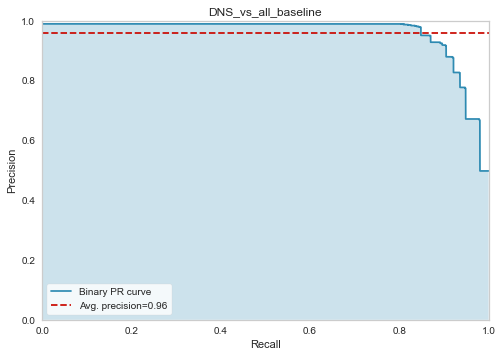

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


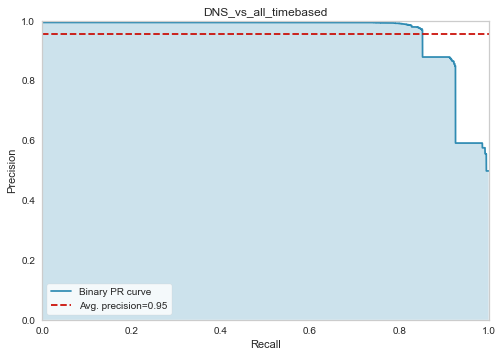

In [6]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])

## Experiment #2: LDAP vs All

Loading Dataset: ../data/downsampled/baseline/LDAP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/LDAP_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/LDAP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/LDAP_vs_all_200000.csv.pickle

Running experiment #2:	LDAP

Baseline results

LDAP_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 21, 'p': 1, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9289732243306082

              precision    recall  f1-score   support

           0       0.88      0.99      0.93     20081
           1       0.99      0.87      0.92     19918

    accuracy                           0.93     39999
   macro avg       0.94      0.93      0.93     39999
weighted avg       0.93      0.93      0.93     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


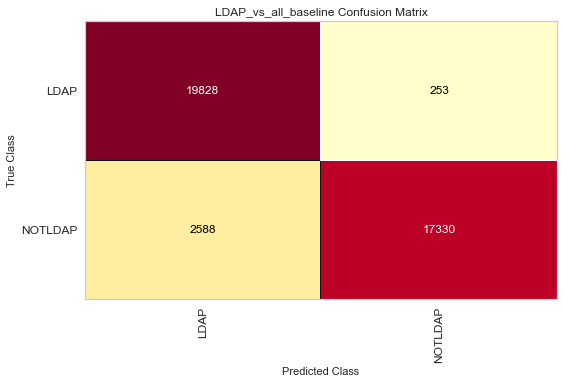


Time-based results

LDAP_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 25, 'p': 2, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9275731893297332

              precision    recall  f1-score   support

           0       0.88      0.99      0.93     20081
           1       0.99      0.86      0.92     19918

    accuracy                           0.93     39999
   macro avg       0.93      0.93      0.93     39999
weighted avg       0.93      0.93      0.93     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


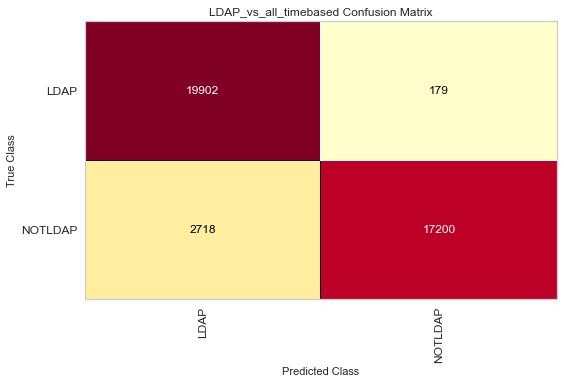

In [7]:
results = do_experiment(2)

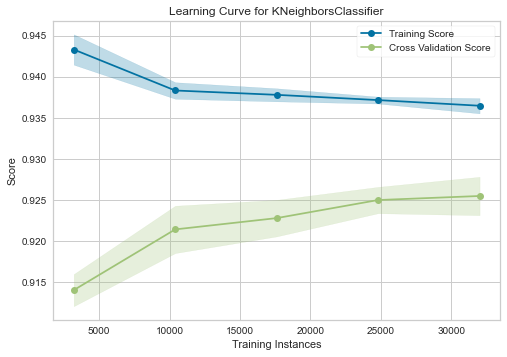

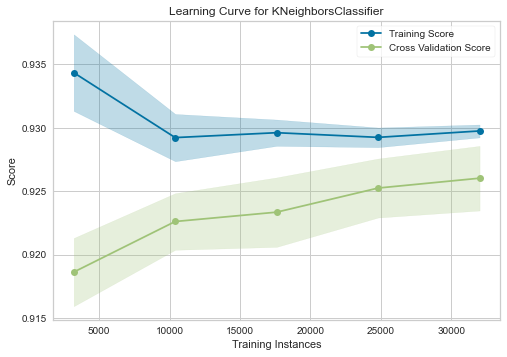

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


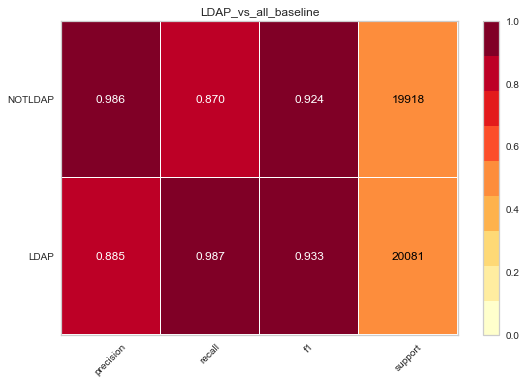

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


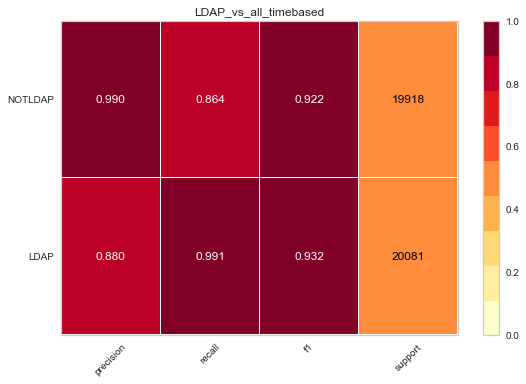

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


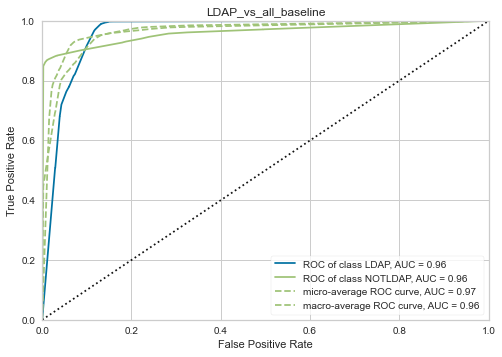

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


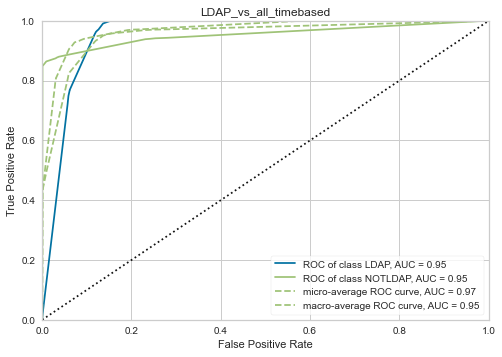

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


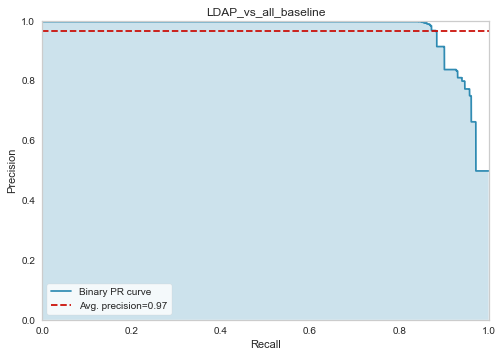

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


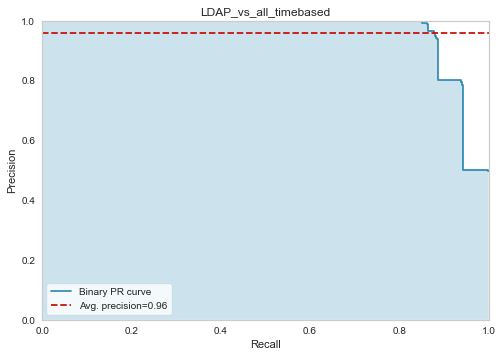

In [8]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])

## Experiment #3: MSSQL vs All

Loading Dataset: ../data/downsampled/baseline/MSSQL_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/MSSQL_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/MSSQL_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/MSSQL_vs_all_200000.csv.pickle

Running experiment #3:	MSSQL

Baseline results

MSSQL_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 29, 'p': 2, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9779244481112028

              precision    recall  f1-score   support

           0       0.99      0.97      0.98     20081
           1       0.97      0.99      0.98     19918

    accuracy                           0.98     39999
   macro avg       0.98      0.98      0.98     39999
weighted avg       0.98      0.98      0.98     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


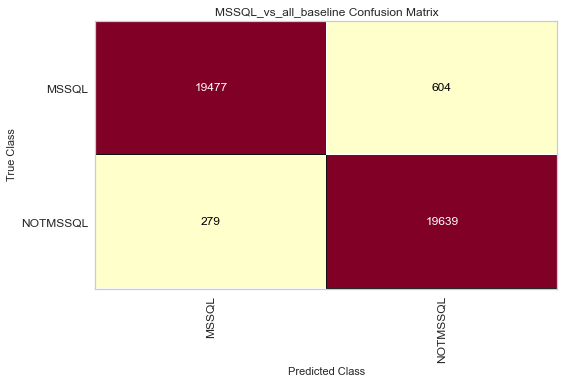


Time-based results

MSSQL_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9747243681092027

              precision    recall  f1-score   support

           0       0.98      0.97      0.97     20081
           1       0.97      0.98      0.97     19918

    accuracy                           0.97     39999
   macro avg       0.97      0.97      0.97     39999
weighted avg       0.97      0.97      0.97     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


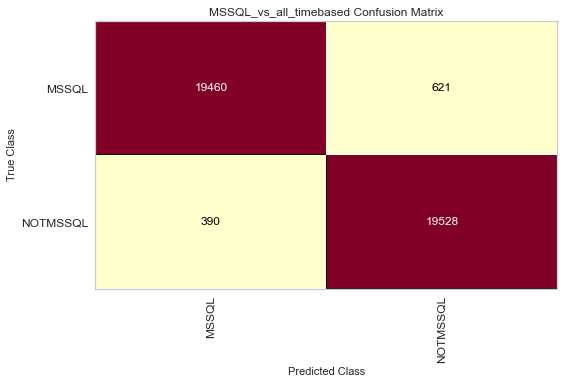

In [9]:
results = do_experiment(3)

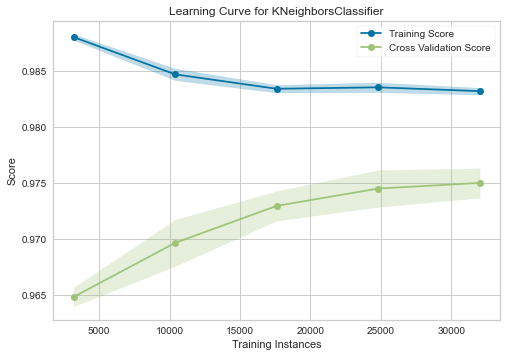

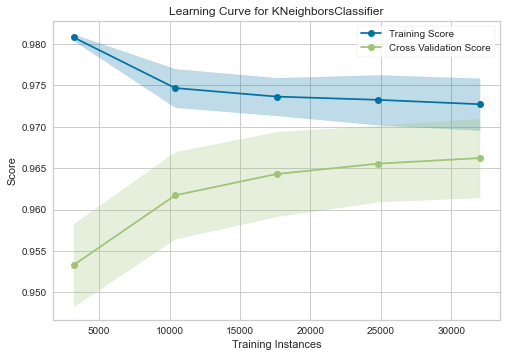

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


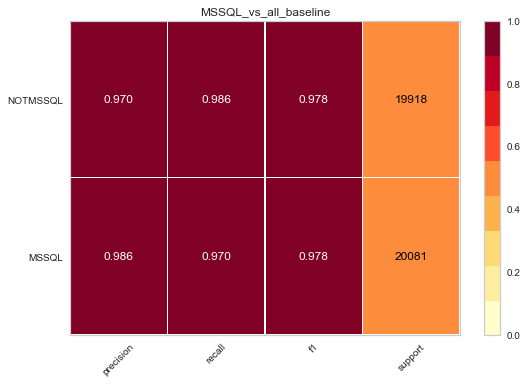

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


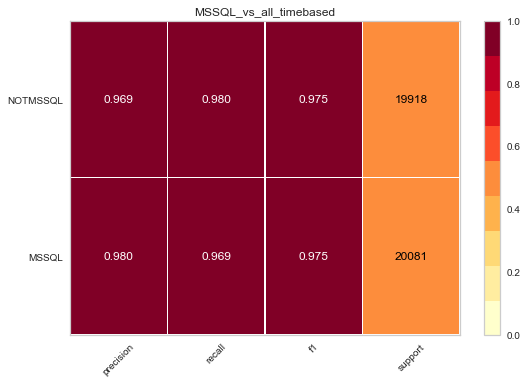

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


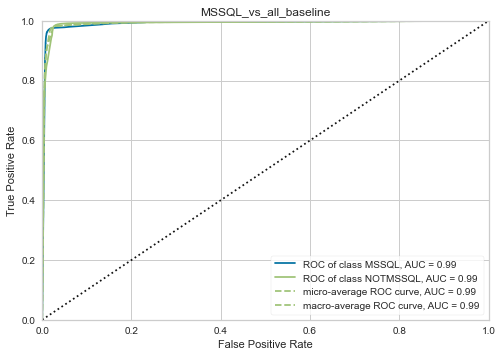

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


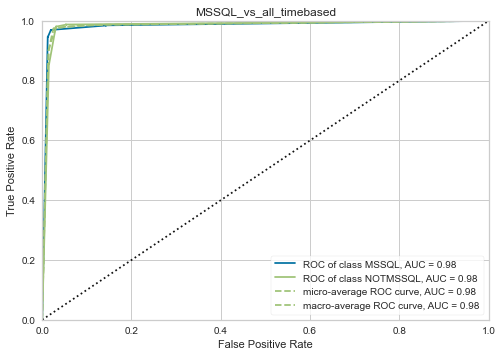

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


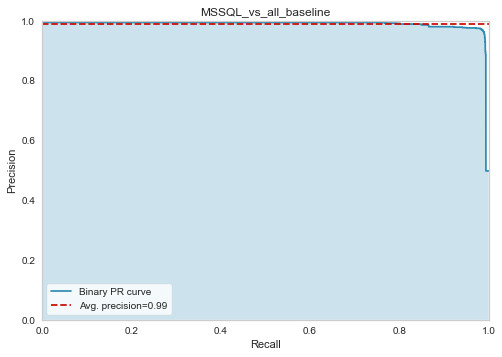

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


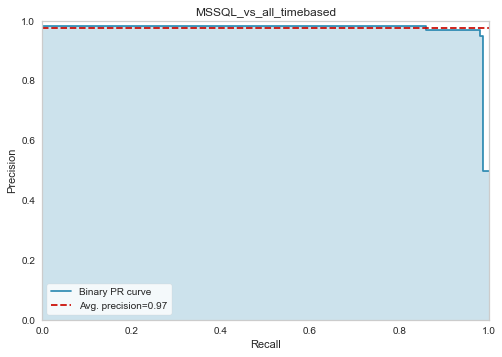

In [10]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])

## Experiment #4: NetBIOS vs All

Loading Dataset: ../data/downsampled/baseline/NetBIOS_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/NetBIOS_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/NetBIOS_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/NetBIOS_vs_all_200000.csv.pickle

Running experiment #4:	NetBIOS

Baseline results

NetBIOS_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 7, 'p': 1, 'weights': 'uniform'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9540238505962649

              precision    recall  f1-score   support

           0       0.99      0.91      0.95     19918
           1       0.92      0.99      0.96     20081

    accuracy                           0.95     39999
   macro avg       0.96      0.95      0.95     39999
weighted avg       0.96      0.95      0.95     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


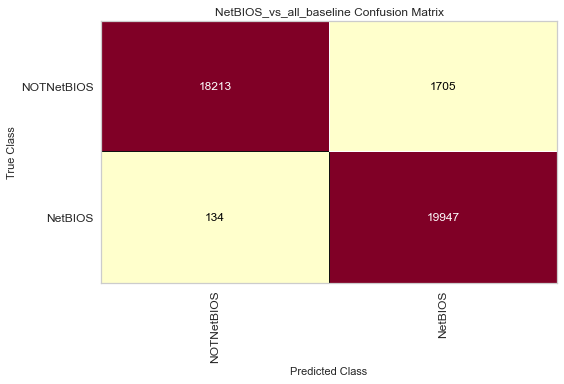


Time-based results

NetBIOS_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 19, 'p': 2, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9540488512212806

              precision    recall  f1-score   support

           0       0.99      0.91      0.95     19918
           1       0.92      0.99      0.96     20081

    accuracy                           0.95     39999
   macro avg       0.96      0.95      0.95     39999
weighted avg       0.96      0.95      0.95     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


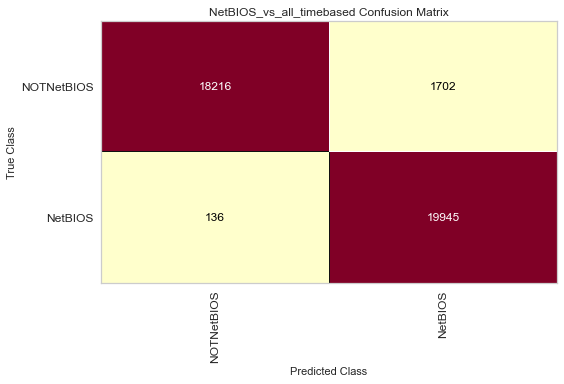

In [11]:
results = do_experiment(4)

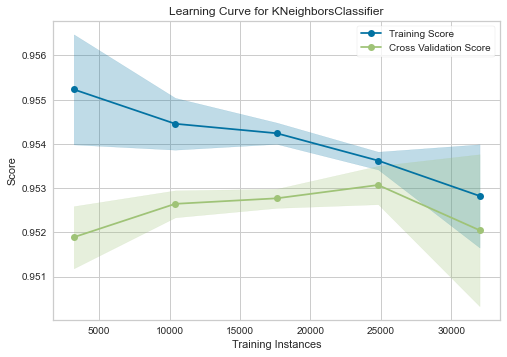

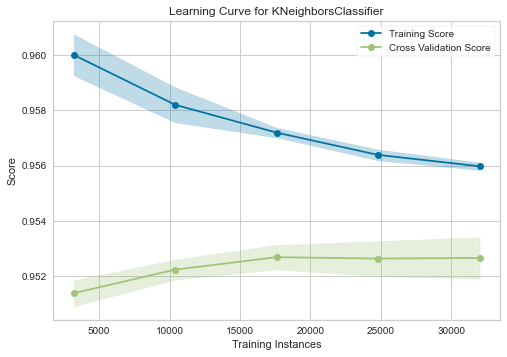

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


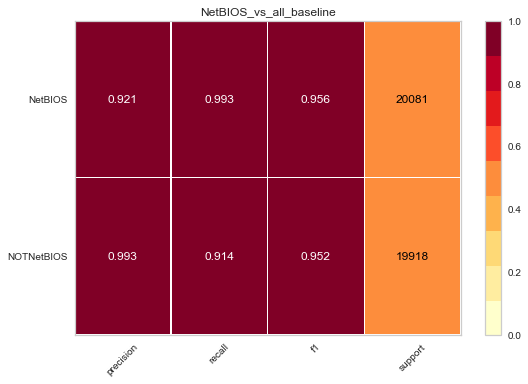

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


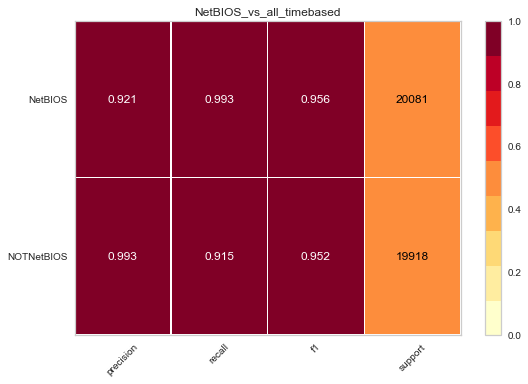

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


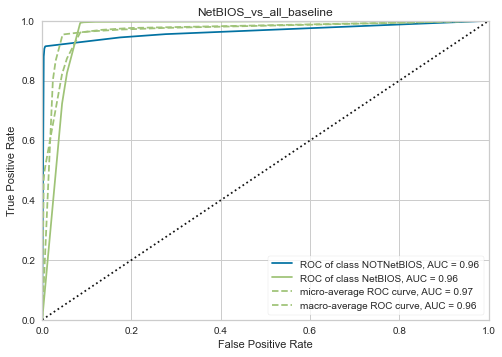

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


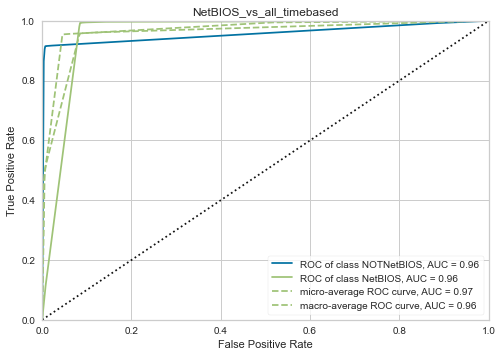

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


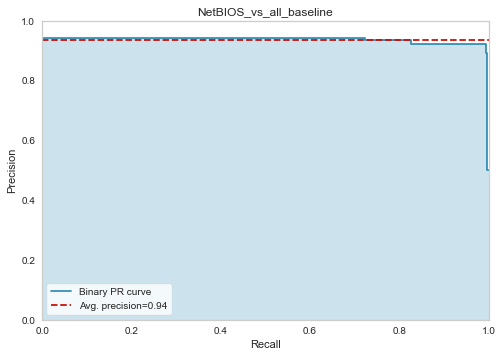

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


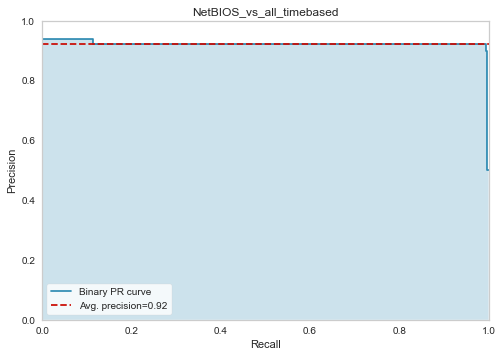

In [12]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])

## Experiment #5: NTP vs All

Loading Dataset: ../data/downsampled/baseline/NTP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/NTP_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/NTP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/NTP_vs_all_200000.csv.pickle

Running experiment #5:	NTP

Baseline results

NTP_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 11, 'p': 1, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9988749718742969

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19918
           1       1.00      1.00      1.00     20081

    accuracy                           1.00     39999
   macro avg       1.00      1.00      1.00     39999
weighted avg       1.00      1.00      1.00     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


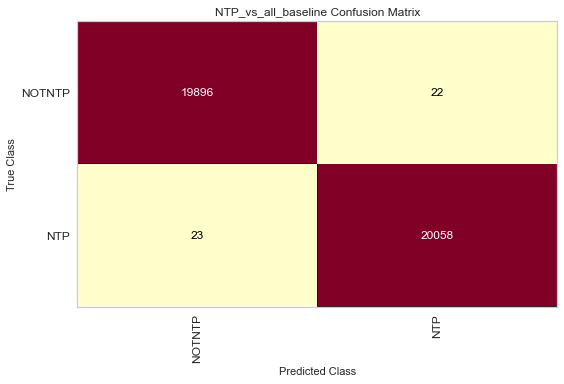


Time-based results

NTP_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9960999024975624

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19918
           1       1.00      1.00      1.00     20081

    accuracy                           1.00     39999
   macro avg       1.00      1.00      1.00     39999
weighted avg       1.00      1.00      1.00     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


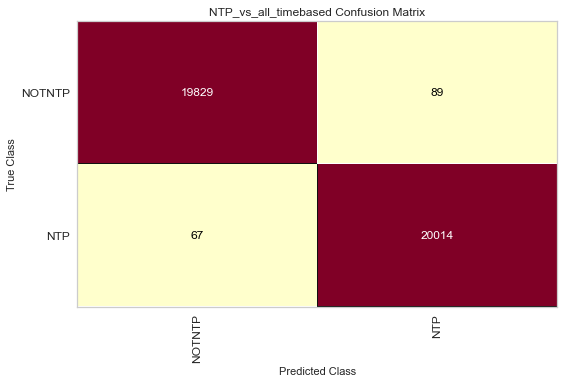

In [13]:
results = do_experiment(5)

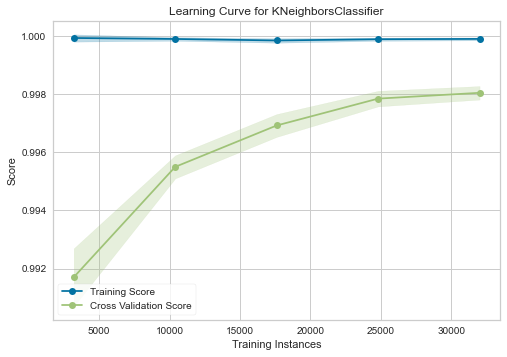

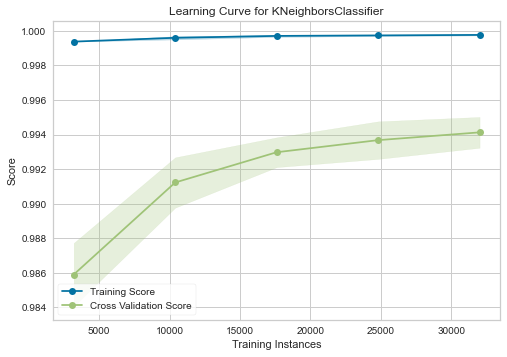

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


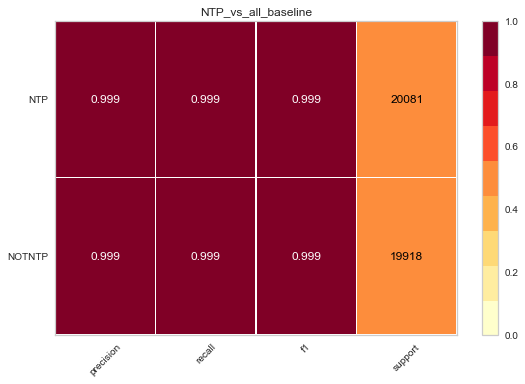

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


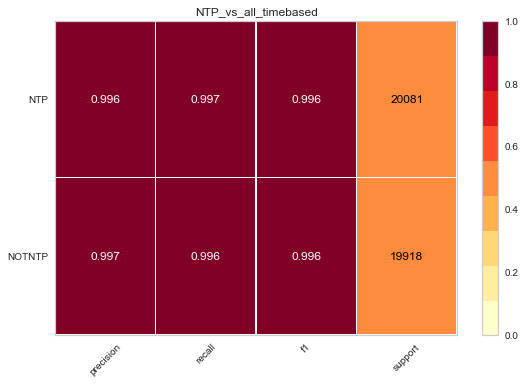

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


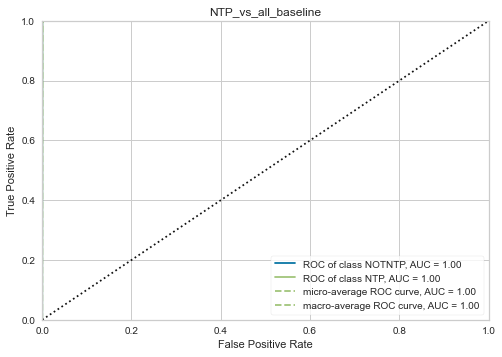

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


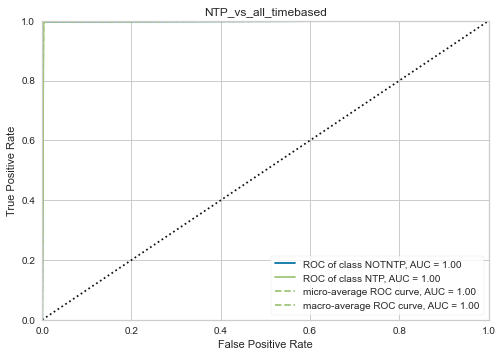

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


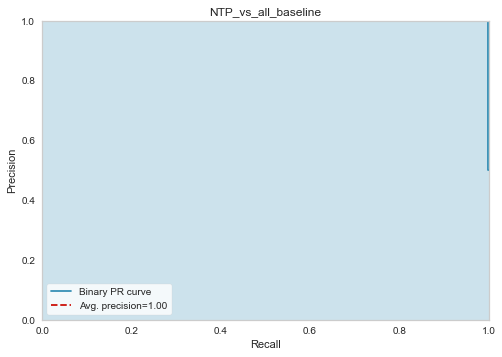

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


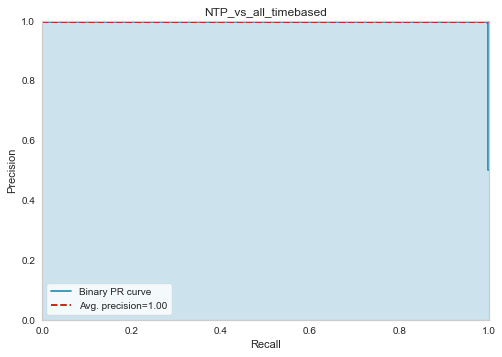

In [14]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])

## Experiment #6: Portmap vs All

Loading Dataset: ../data/downsampled/baseline/Portmap_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/Portmap_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/Portmap_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/Portmap_vs_all_200000.csv.pickle

Running experiment #6:	Portmap

Baseline results

Portmap_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 43, 'p': 1, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9606740168504213

              precision    recall  f1-score   support

           0       0.99      0.93      0.96     19918
           1       0.94      0.99      0.96     20081

    accuracy                           0.96     39999
   macro avg       0.96      0.96      0.96     39999
weighted avg       0.96      0.96      0.96     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


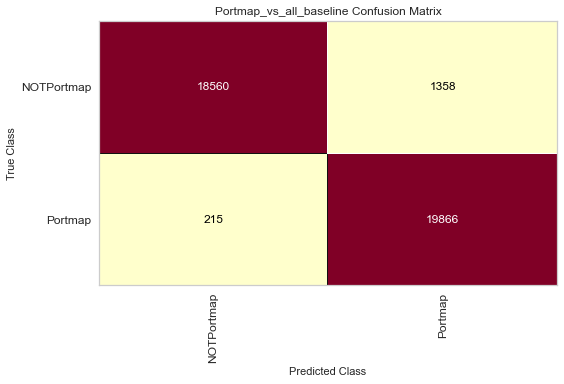


Time-based results

Portmap_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 5, 'p': 1, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9537988449711243

              precision    recall  f1-score   support

           0       1.00      0.91      0.95     19918
           1       0.92      1.00      0.96     20081

    accuracy                           0.95     39999
   macro avg       0.96      0.95      0.95     39999
weighted avg       0.96      0.95      0.95     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


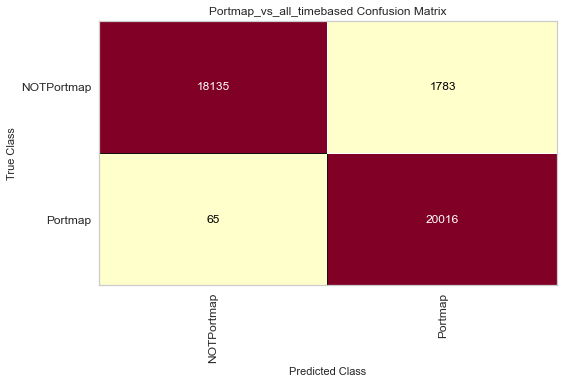

In [15]:
results = do_experiment(6)

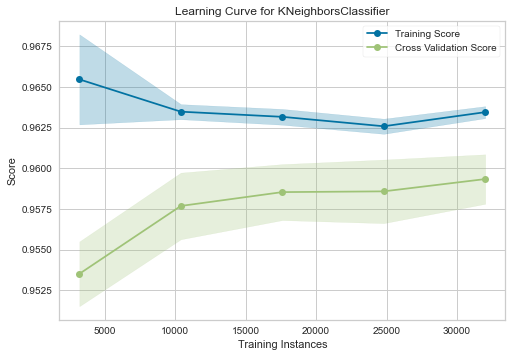

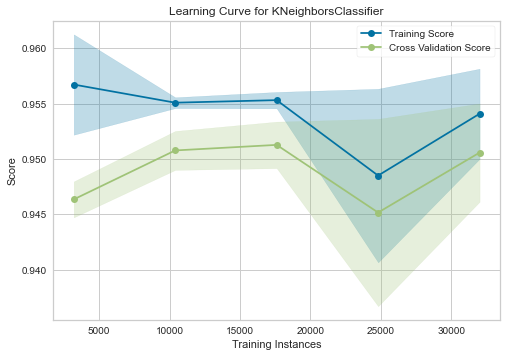

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


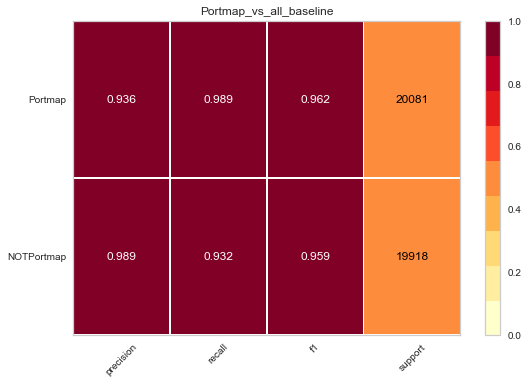

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


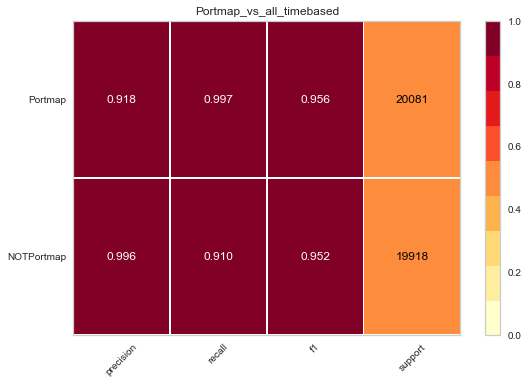

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


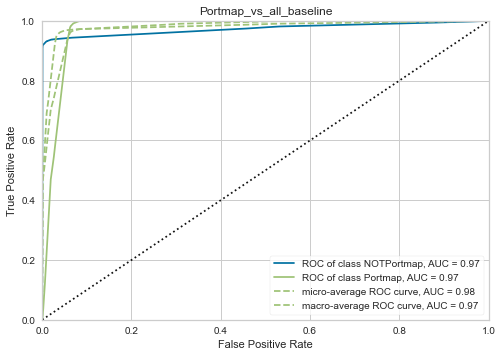

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


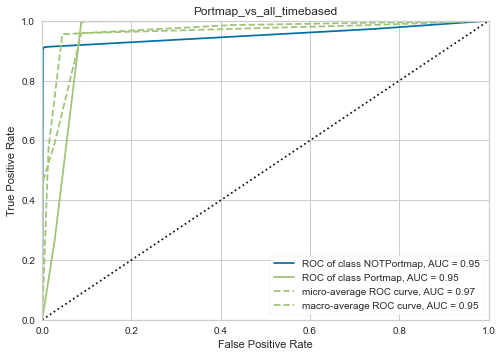

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


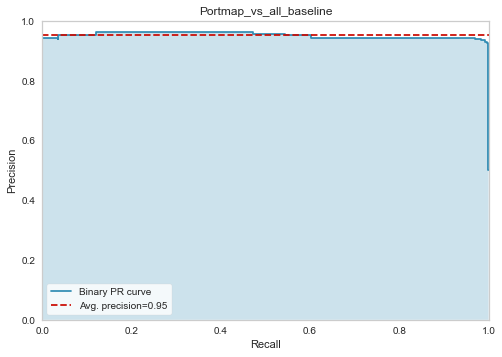

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


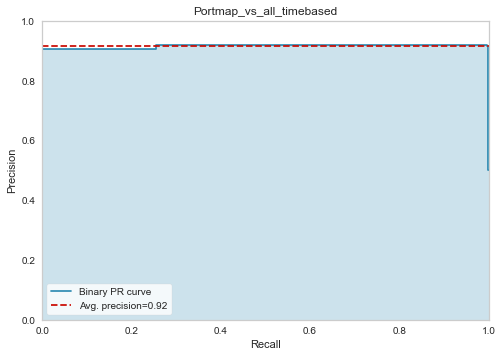

In [16]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])

## Experiment #7: SNMP vs All

Loading Dataset: ../data/downsampled/baseline/SNMP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/SNMP_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/SNMP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/SNMP_vs_all_200000.csv.pickle

Running experiment #7:	SNMP

Baseline results

SNMP_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 41, 'p': 1, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9187229680742018

              precision    recall  f1-score   support

           0       0.92      0.91      0.92     19918
           1       0.91      0.93      0.92     20081

    accuracy                           0.92     39999
   macro avg       0.92      0.92      0.92     39999
weighted avg       0.92      0.92      0.92     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


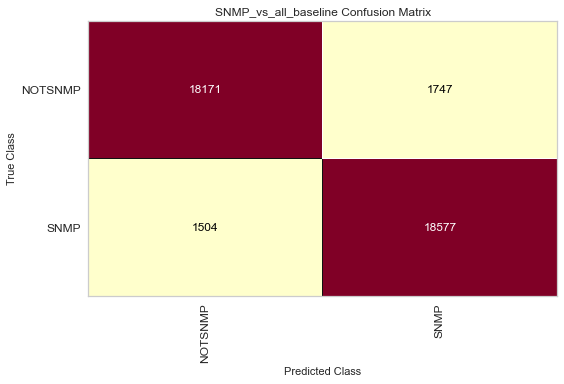


Time-based results

SNMP_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 47, 'p': 2, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9125978149453736

              precision    recall  f1-score   support

           0       0.88      0.95      0.92     19918
           1       0.95      0.87      0.91     20081

    accuracy                           0.91     39999
   macro avg       0.92      0.91      0.91     39999
weighted avg       0.92      0.91      0.91     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


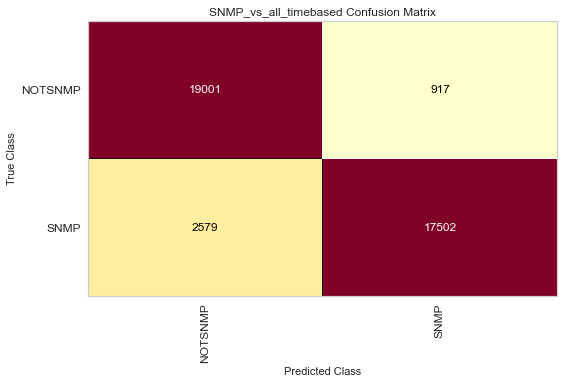

In [17]:
results = do_experiment(7)

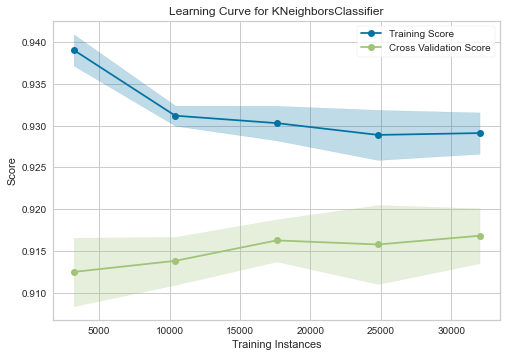

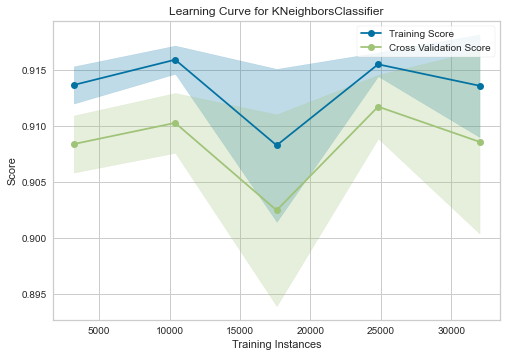

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


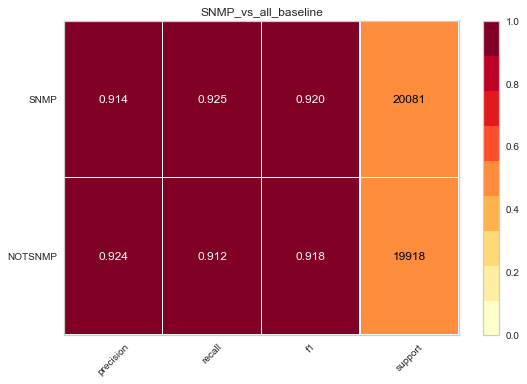

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


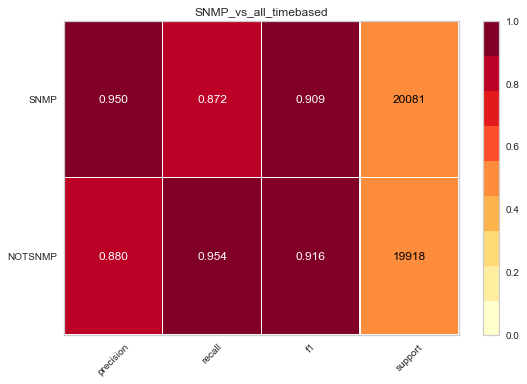

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


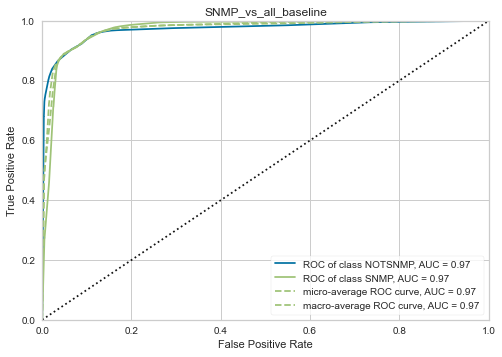

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


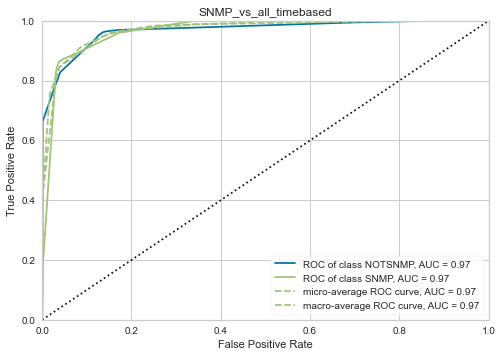

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


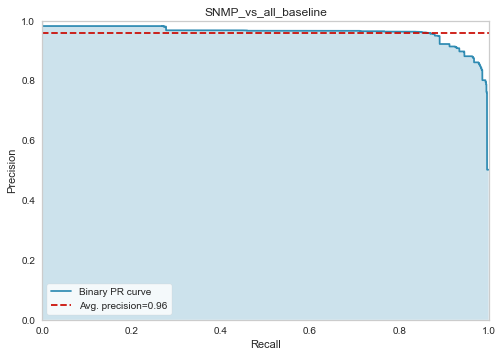

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


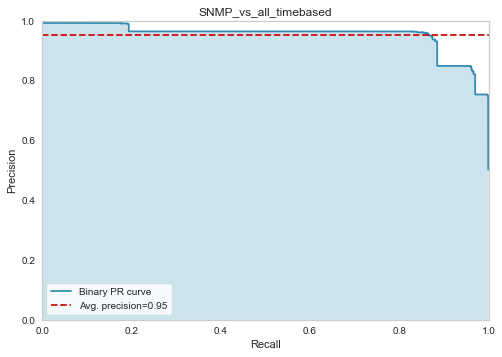

In [18]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])

## Experiment #8: SSDP vs All

Loading Dataset: ../data/downsampled/baseline/SSDP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/SSDP_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/SSDP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/SSDP_vs_all_200000.csv.pickle

Running experiment #8:	SSDP

Baseline results

SSDP_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 11, 'p': 1, 'weights': 'uniform'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.938673466836671

              precision    recall  f1-score   support

           0       0.98      0.90      0.94     19918
           1       0.91      0.98      0.94     20081

    accuracy                           0.94     39999
   macro avg       0.94      0.94      0.94     39999
weighted avg       0.94      0.94      0.94     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


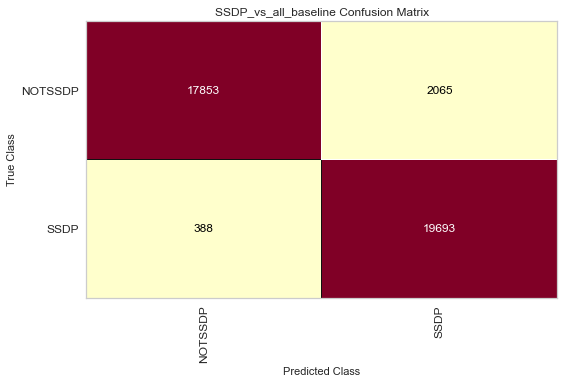


Time-based results

SSDP_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9338233455836396

              precision    recall  f1-score   support

           0       0.97      0.89      0.93     19918
           1       0.90      0.97      0.94     20081

    accuracy                           0.93     39999
   macro avg       0.94      0.93      0.93     39999
weighted avg       0.94      0.93      0.93     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


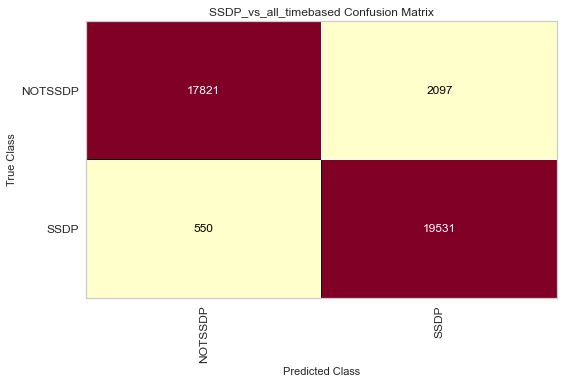

In [19]:
results = do_experiment(8)

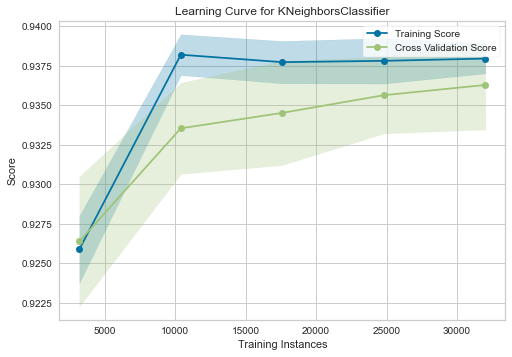

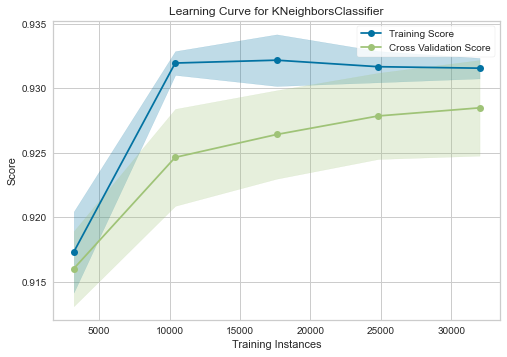

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


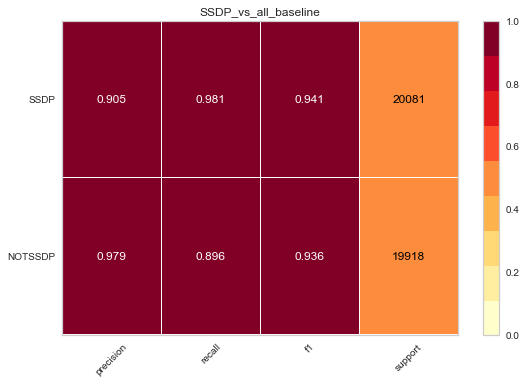

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


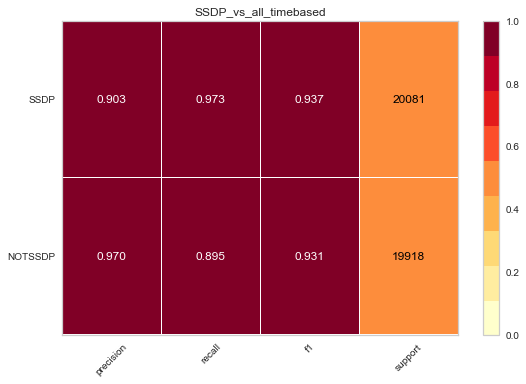

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


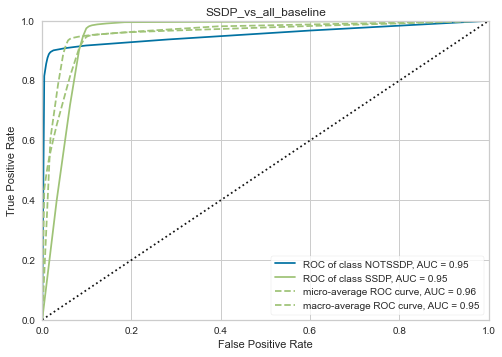

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


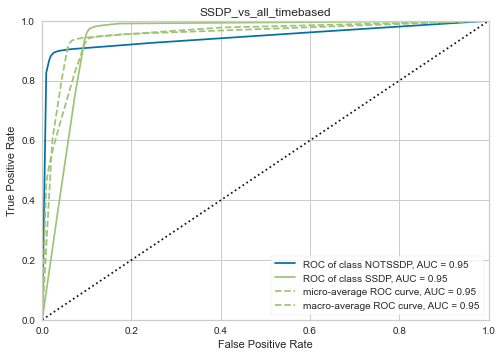

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


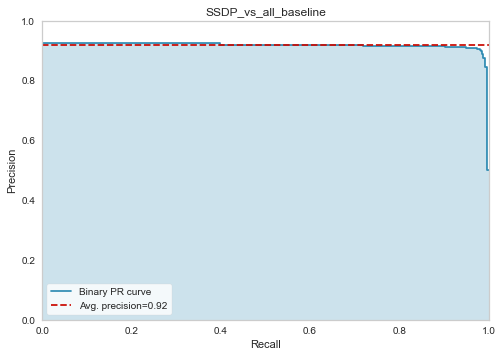

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


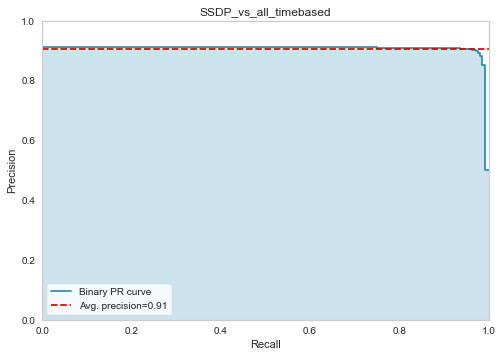

In [20]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])

## Experiment #9: Syn vs All

Loading Dataset: ../data/downsampled/baseline/Syn_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/Syn_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/Syn_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/Syn_vs_all_200000.csv.pickle

Running experiment #9:	Syn

Baseline results

Syn_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 11, 'p': 1, 'weights': 'uniform'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9700492512312808

              precision    recall  f1-score   support

           0       1.00      0.94      0.97     19918
           1       0.95      1.00      0.97     20081

    accuracy                           0.97     39999
   macro avg       0.97      0.97      0.97     39999
weighted avg       0.97      0.97      0.97     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


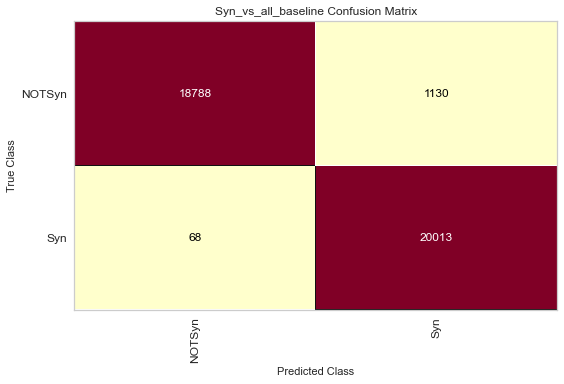


Time-based results

Syn_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9573489337233431

              precision    recall  f1-score   support

           0       0.98      0.93      0.96     19918
           1       0.93      0.98      0.96     20081

    accuracy                           0.96     39999
   macro avg       0.96      0.96      0.96     39999
weighted avg       0.96      0.96      0.96     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


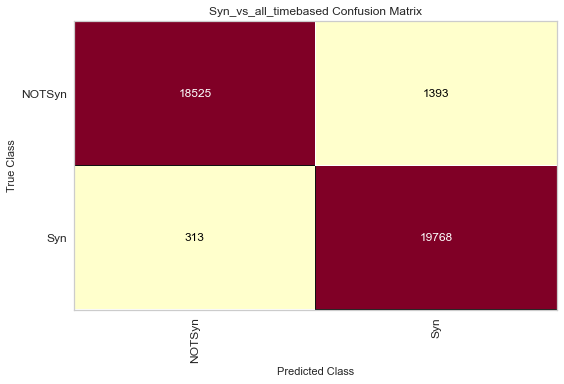

In [21]:
results = do_experiment(9)

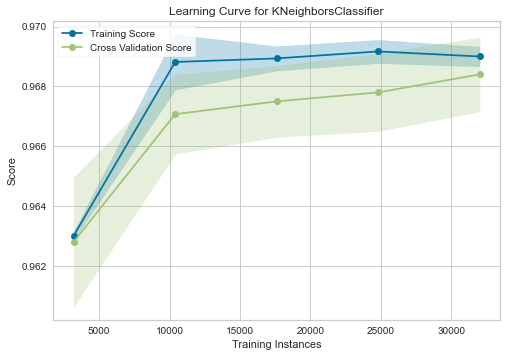

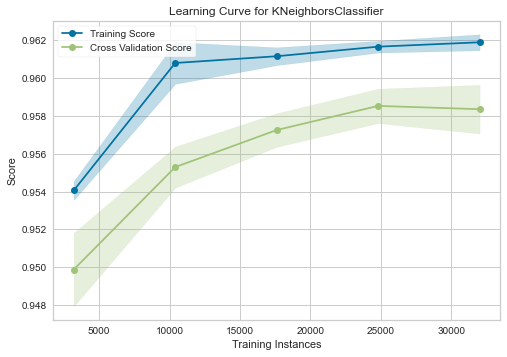

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


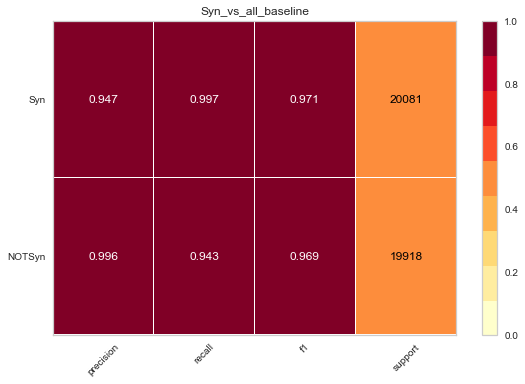

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


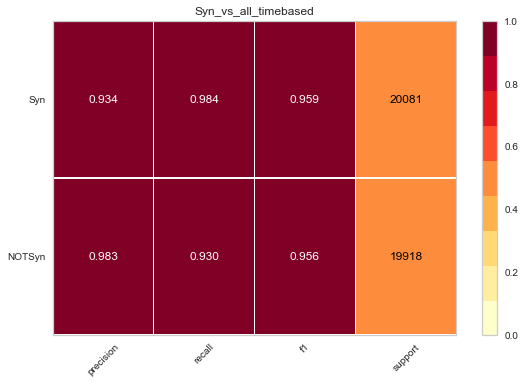

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


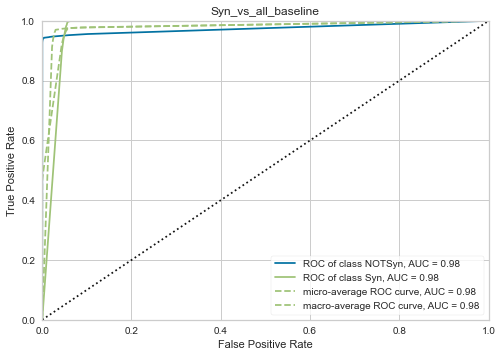

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


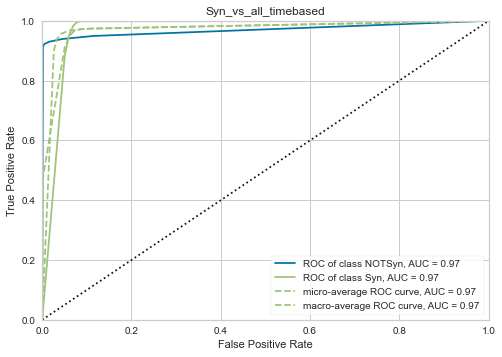

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


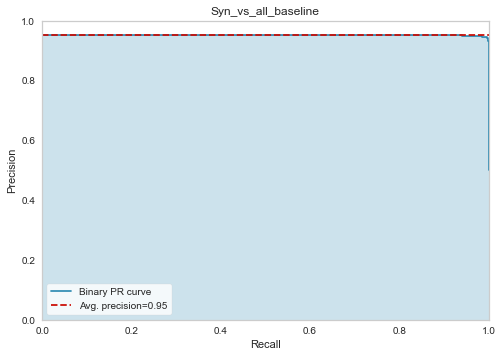

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


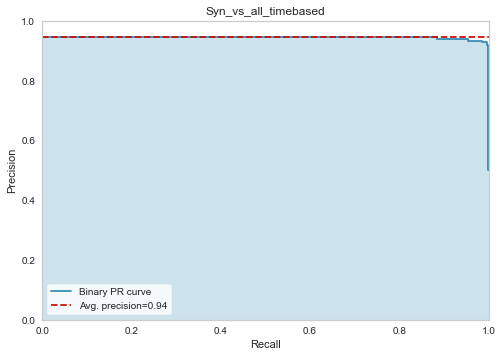

In [22]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])

## Experiment #10: TFTP vs All

Loading Dataset: ../data/downsampled/baseline/TFTP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/TFTP_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/TFTP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/TFTP_vs_all_200000.csv.pickle

Running experiment #10:	TFTP

Baseline results

TFTP_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9954248856221406

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     19918
           1       1.00      0.99      1.00     20081

    accuracy                           1.00     39999
   macro avg       1.00      1.00      1.00     39999
weighted avg       1.00      1.00      1.00     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


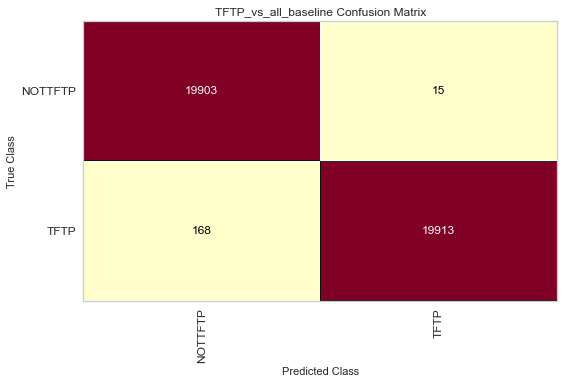


Time-based results

TFTP_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9946748668716718

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     19918
           1       1.00      0.99      0.99     20081

    accuracy                           0.99     39999
   macro avg       0.99      0.99      0.99     39999
weighted avg       0.99      0.99      0.99     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


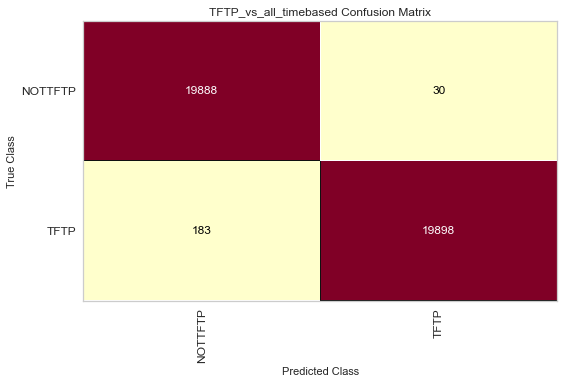

In [23]:
results = do_experiment(10)

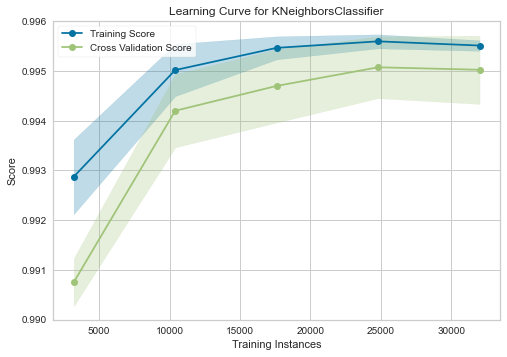

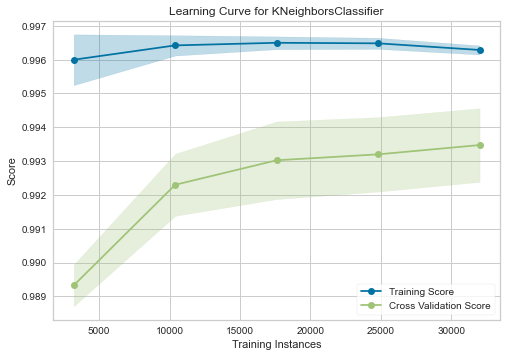

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


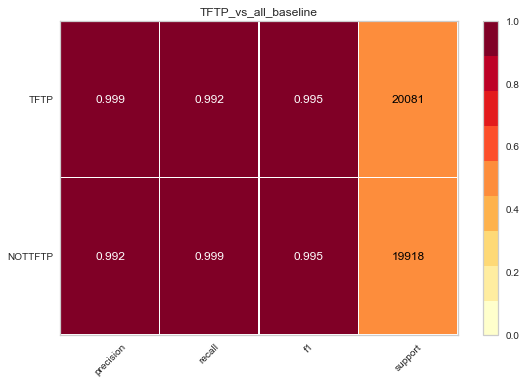

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


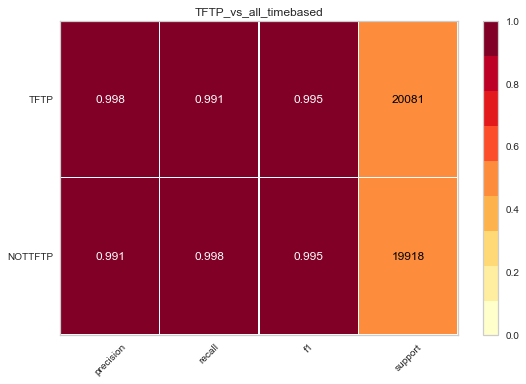

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


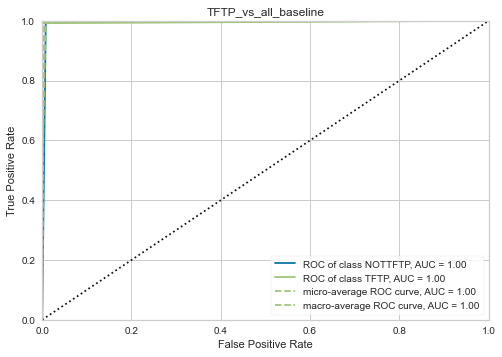

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


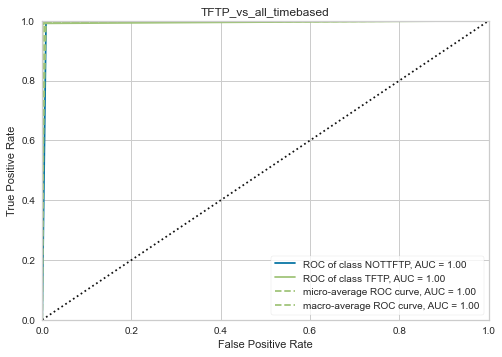

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


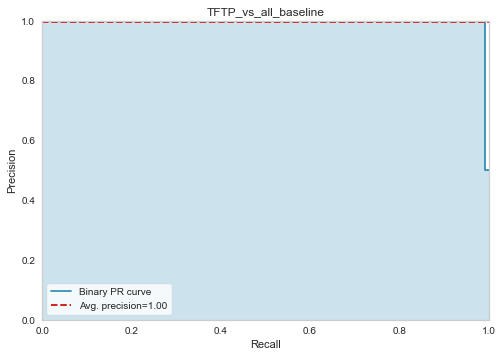

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


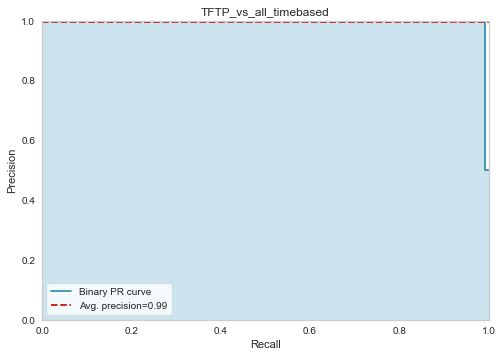

In [24]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])

## Experiment #11: UDP vs All

Loading Dataset: ../data/downsampled/baseline/UDP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/UDP_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/UDP_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/UDP_vs_all_200000.csv.pickle

Running experiment #11:	UDP

Baseline results

UDP_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 19, 'p': 1, 'weights': 'uniform'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9465236630915773

              precision    recall  f1-score   support

           0       0.99      0.90      0.94     19918
           1       0.91      0.99      0.95     20081

    accuracy                           0.95     39999
   macro avg       0.95      0.95      0.95     39999
weighted avg       0.95      0.95      0.95     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


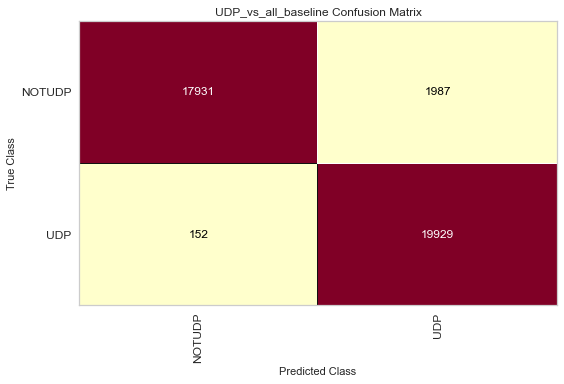


Time-based results

UDP_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9429235730893273

              precision    recall  f1-score   support

           0       0.98      0.90      0.94     19918
           1       0.91      0.99      0.95     20081

    accuracy                           0.94     39999
   macro avg       0.95      0.94      0.94     39999
weighted avg       0.95      0.94      0.94     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


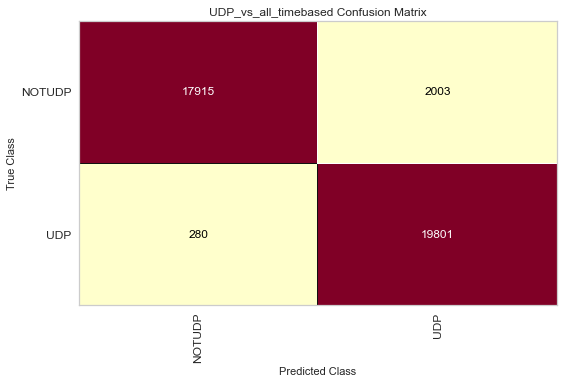

In [25]:
results = do_experiment(11)

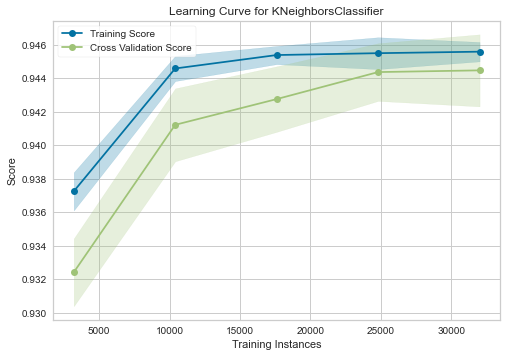

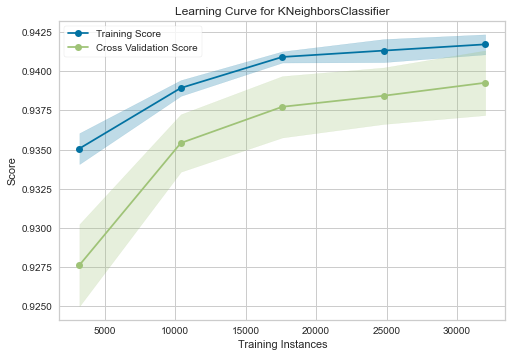

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


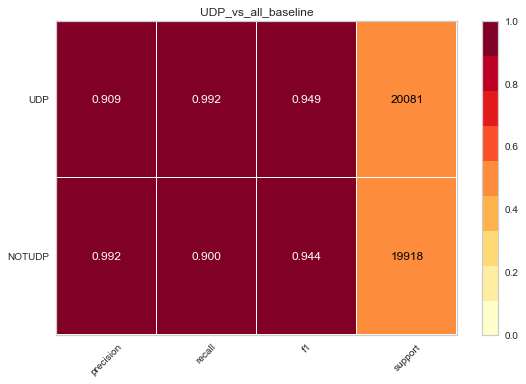

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


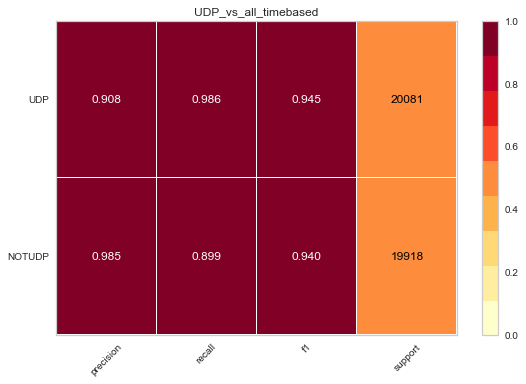

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


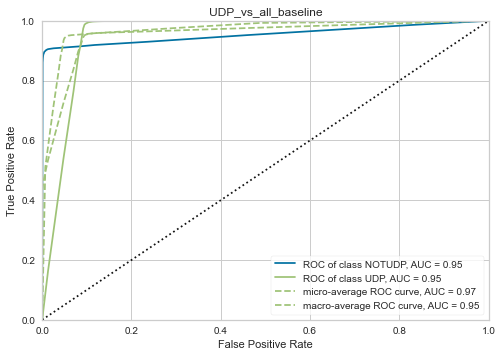

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


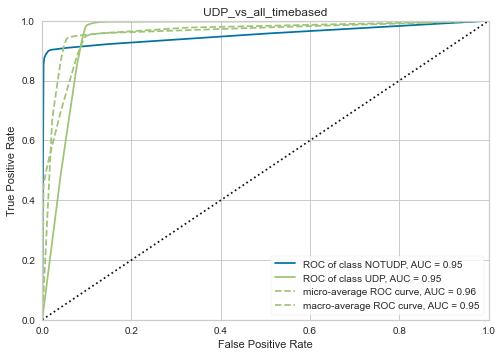

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


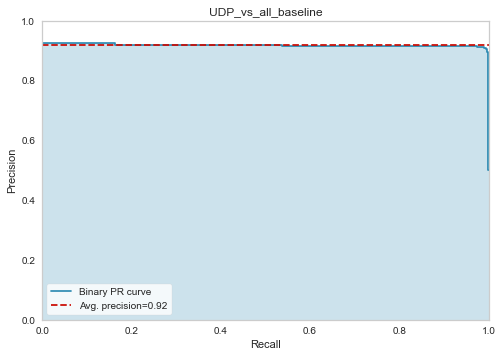

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


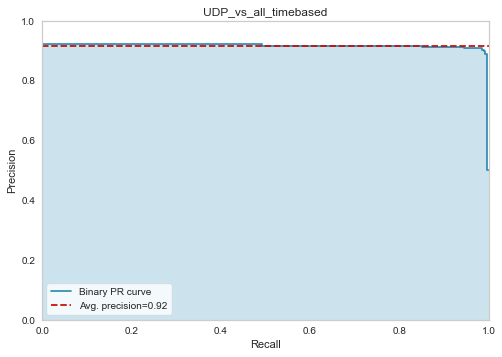

In [26]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])

## Experiment #12: UDP-lag vs All

Loading Dataset: ../data/downsampled/baseline/UDPLag_vs_all_200000.csv
	To Dataset Cache: ../data/cache/baseline/UDPLag_vs_all_200000.csv.pickle

Loading Dataset: ../data/downsampled/timebased/UDPLag_vs_all_200000.csv
	To Dataset Cache: ../data/cache/timebased/UDPLag_vs_all_200000.csv.pickle

Running experiment #12:	UDPLag

Baseline results

UDPLag_vs_all_baseline: (199996, 70)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 13, 'p': 1, 'weights': 'uniform'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.926723168079202

              precision    recall  f1-score   support

           0       0.94      0.91      0.93     19918
           1       0.91      0.94      0.93     20081

    accuracy                           0.93     39999
   macro avg       0.93      0.93      0.93     39999
weighted avg       0.93      0.93      0.93     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


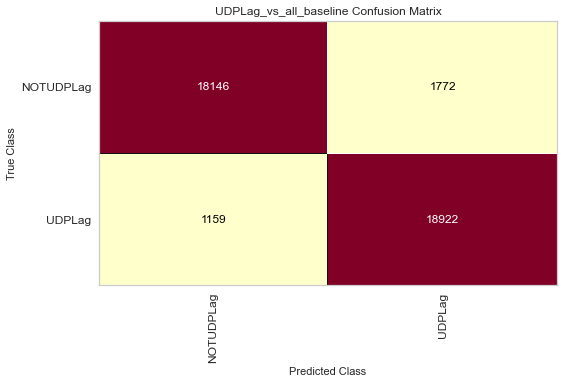


Time-based results

UDPLag_vs_all_timebased: (199996, 26)
Running gridsearch on 50000 out of 199996 samples
Fitting 5 folds for each of 92 candidates, totalling 460 fits
	Best Parameters found by gridsearch: {'n_neighbors': 27, 'p': 2, 'weights': 'distance'}

Running K-Nearest Neighbors on 199996 samples
	Accuracy: 0.9087477186929673

              precision    recall  f1-score   support

           0       0.91      0.91      0.91     19918
           1       0.91      0.91      0.91     20081

    accuracy                           0.91     39999
   macro avg       0.91      0.91      0.91     39999
weighted avg       0.91      0.91      0.91     39999



C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


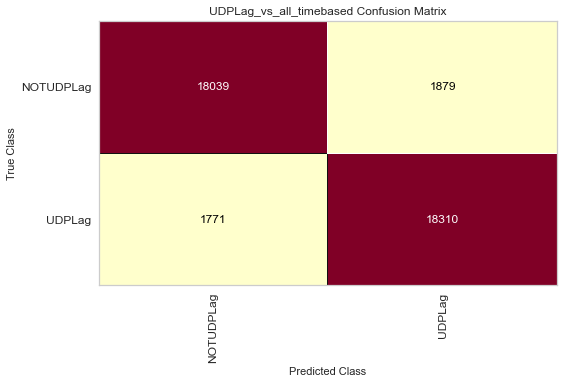

In [27]:
results = do_experiment(12)

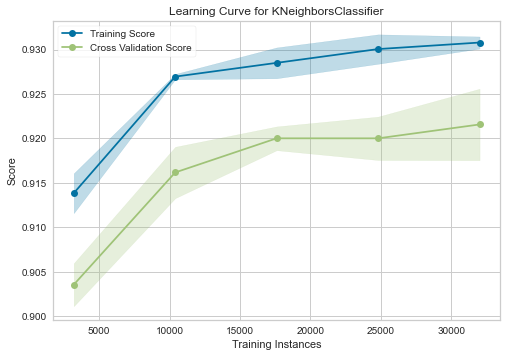

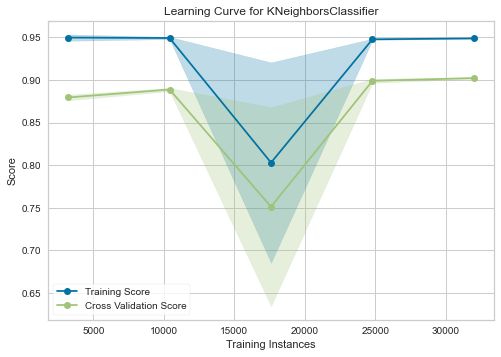

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


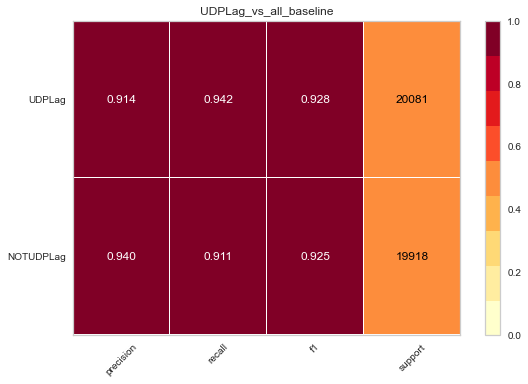

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


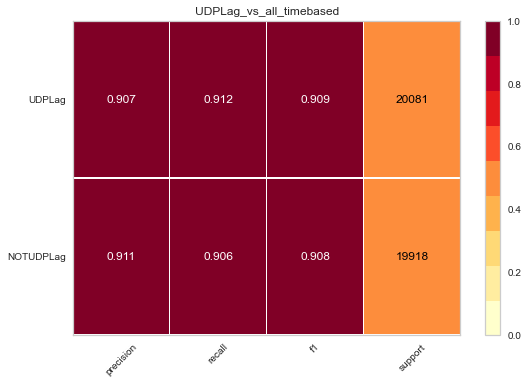

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


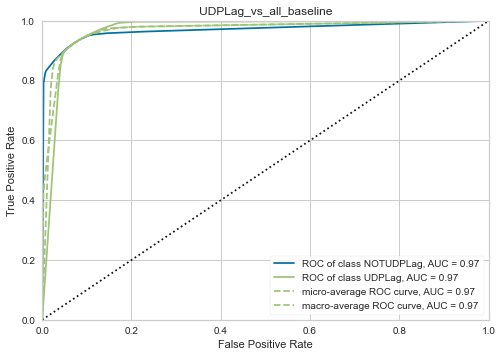

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


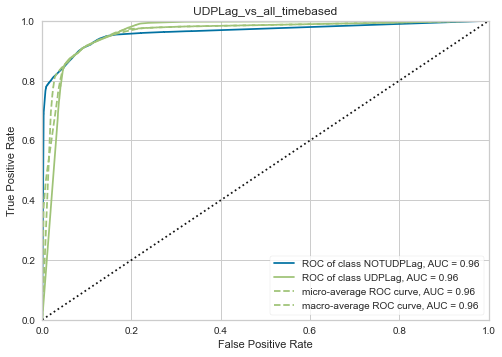

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


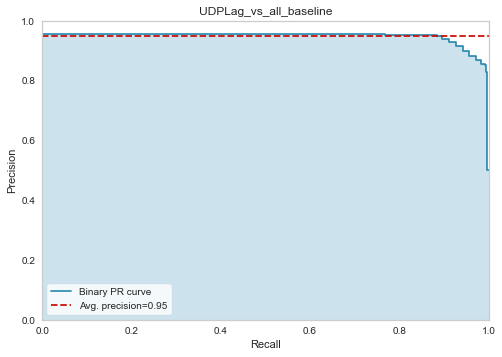

C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:234: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


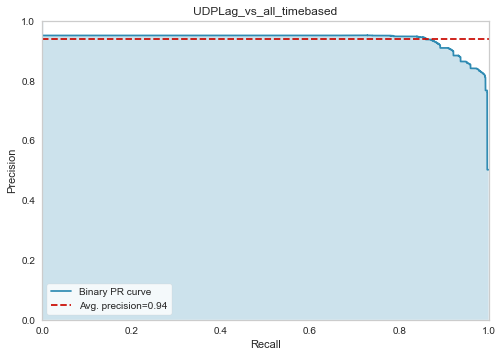

In [28]:
visualize_learning_curve_test(results[Baseline])
visualize_learning_curve_test(results[Timebased])
visualize_report(results[Baseline])
visualize_report(results[Timebased])
visualize_roc(results[Baseline])
visualize_roc(results[Timebased])
visualize_pr_curve(results[Baseline])
visualize_pr_curve(results[Timebased])